# Object masks from prompts with SAM2 and OpenVINO

<div class="alert alert-block alert-danger"> <b>Important note:</b> This notebook requires python >= 3.10. Please make sure that your environment fulfill to this requirement before running it </div>

#### Table of contents:

- [Prerequisites](#Prerequisites)
- [Image prediction](#Image-prediction)
    - [Prepare image](#Prepare-image)
    - [Download and inference PyTorch model](#Download-and-inference-PyTorch-model)
    - [Convert model to OpenVINO Intermediate Representation](#Convert-model-to-OpenVINO-Intermediate-Representation)
        - [Image Encoder](#Image-Encoder)
        - [Mask predictor](#Mask-predictor)
    - [Run OpenVINO model in interactive segmentation mode](#Run-OpenVINO-model-in-interactive-segmentation-mode)
        - [Example Image](#Example-Image)
        - [Preprocessing and visualization utilities](#Preprocessing-and-visualization-utilities)
        - [Image encoding](#Image-encoding)
        - [Example point input](#Example-point-input)
        - [Example with multiple points](#Example-with-multiple-points)
        - [Example box and point input with negative label](#Example-box-and-point-input-with-negative-label)
    - [Interactive segmentation](#Interactive-segmentation)
- [Run OpenVINO model in automatic mask generation mode](#Run-OpenVINO-model-in-automatic-mask-generation-mode)
- [Optimize encoder using NNCF Post-training Quantization API](#Optimize-encoder-using-NNCF-Post-training-Quantization-API)
    - [Prepare a calibration dataset](#Prepare-a-calibration-dataset)
    - [Run quantization and serialize OpenVINO IR model](#Run-quantization-and-serialize-OpenVINO-IR-model)
    - [Validate Quantized Model Inference](#Validate-Quantized-Model-Inference)
    - [Compare Performance of the Original and Quantized Models](#Compare-Performance-of-the-Original-and-Quantized-Models)
- [Video prediction](#Video-prediction)
    - [Load the SAM2 PyTorch model](#Load-the-SAM2-PyTorch-model)
    - [Convert Image Encoder Model to OpenVINO IR](#Convert-Image-Encoder-Model-to-OpenVINO-IR)
        - [Convert Image Encoder Model to OpenVINO IR](#Convert-Image-Encoder-Model-to-OpenVINO-IR)
        - [Mask Prediction Model](#Mask-Prediction-Model)
        - [Memory Encoder Model](#Memory-Encoder-Model)
        - [Memory Attention Model](#Memory-Attention-Model)
    - [Infer video prediction model in OpenVINO IR format](#Infer-video-prediction-model-in-OpenVINO-IR-format)
    - [Prepare data](#Prepare-data)
    - [Run Interactive Segmentation with Gradio](#Run-Interactive-Segmentation-with-Gradio)


### Installation Instructions

This is a self-contained example that relies solely on its own code.

We recommend  running the notebook in a virtual environment. You only need a Jupyter server to start.
For details, please refer to [Installation Guide](https://github.com/openvinotoolkit/openvino_notebooks/blob/latest/README.md#-installation-guide).

<img referrerpolicy="no-referrer-when-downgrade" src="https://static.scarf.sh/a.png?x-pxid=5b5a4db0-7875-4bfb-bdbd-01698b5b1a77&file=notebooks/segment-anything/segment-anything-2.ipynb" />

Segmentation - identifying which image pixels belong to an object - is a core task in computer vision and is used in a broad array of applications, from analyzing scientific imagery to editing photos. But creating an accurate segmentation model for specific tasks typically requires highly specialized work by technical experts with access to AI training infrastructure and large volumes of carefully annotated in-domain data. Reducing the need for task-specific modeling expertise, training compute, and custom data annotation for image segmentation is the main goal of the Segment Anything project.

[Segment Anything Model 2 (SAM 2)](https://segment-anything.com/) is a foundation model towards solving promptable visual segmentation in images and videos. It extend SAM to video by considering images as a video with a single frame. The SAM 2 model extends the promptable capability of SAM to the video domain by adding a per session memory module that captures information about the target object in the video.  This allows SAM 2 to track the selected object throughout all video frames, even if the object temporarily disappears from view, as the model has context of the object from previous frames. SAM 2 also supports the ability to make corrections in the mask prediction based on additional prompts on any frame. SAM 2’s streaming architecture—which processes video frames one at a time—is also a natural generalization of SAM to the video domain. When SAM 2 is applied to images, the memory module is empty and the model behaves like SAM. 

The model design is a simple transformer architecture with streaming memory for real-time video processing. The model is built a model-in-the-loop data engine, which improves model and data via user interaction, to collect SA-V dataset, the largest video segmentation dataset to date. SAM 2 provides strong performance across a wide range of tasks and visual domains.
This notebook shows an example of how to convert and use Segment Anything Model 2 in OpenVINO format, allowing it to run on a variety of platforms that support an OpenVINO.

The diagram below demonstrates the SAM 2 architecture. For a given frame, the segmentation prediction is conditioned on the current prompt and/or on previously observed memories. Videos are processed in a streaming fashion with frames being consumed one at a time by the image encoder, and cross-attended to memories of the target object from previous frames. The mask decoder, which optionally also takes input prompts, predicts the segmentation mask for that frame. Finally, a memory encoder transforms the prediction and image encoder embeddings (not shown in the figure) for use in future frames

![model_diagram](https://raw.githubusercontent.com/facebookresearch/segment-anything-2/main/assets/model_diagram.png)


More details about approach can be found in the [paper](https://ai.meta.com/research/publications/sam-2-segment-anything-in-images-and-videos/), original [repo](https://github.com/facebookresearch/segment-anything-2) and [Meta AI blog post](https://ai.meta.com/blog/segment-anything-2/)

## Prerequisites
[back to top ⬆️](#Table-of-contents:)


In [1]:
import platform

%pip install -q "gradio>=4.13" "openvino>=2024.3.0" "nncf>=2.7.0" "torch>=2.3.1" "torchvision>=0.18.1" Pillow opencv-python tqdm  --extra-index-url https://download.pytorch.org/whl/cpu
%pip install "iopath>=0.1.10" "pillow>=9.4.0"  "hydra-core>=1.3.2"
%pip install numpy

if platform.system() != "Windows":
    %pip install -q "matplotlib>=3.4"
else:
    %pip install -q "matplotlib>=3.4,<3.7"

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import requests
from pathlib import Path

if not Path("notebook_utils.py").exists():
    r = requests.get(
        url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/utils/notebook_utils.py",
    )
    open("notebook_utils.py", "w").write(r.text)

from notebook_utils import download_file

Clone and install segment-anything-2

In [4]:
import os

if not os.path.exists("segment-anything-2"):
    !git clone https://github.com/facebookresearch/segment-anything-2.git

%cd segment-anything-2
!SAM2_BUILD_CUDA=0 pip install -e ".[demo]"
%cd ..

/home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything/segment-anything-2


/home/labuser/work/notebook/review4/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Obtaining file:///home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for SAM-2: filename=SAM_2-1.0-0.editable-py3-none-any.whl size=12344 sha256=f7dadbc134810ded9130279e8e53d6bf1bbef1fa3cd3edf6c12b456acfa4c149
  Stored in directory: /tmp/pip-ephem-wheel-cache-85a41ega/wheels/7a/7d/2f/ba9a4da2b5f95e0174471d9cef937e623f1b8119f0dbe33cc1
Successfully built SAM-2
  Attempting uninstall: SAM-2
    Found existing installation: SAM-2 1.0
    Uninstalling SAM-2-1.0:
      Successfully uninstalled SAM-2-1.0
/home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything


## Image prediction
[back to top ⬆️](#Table-of-contents:)

### Prepare image
[back to top ⬆️](#Table-of-contents:)

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

download_file("https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg")

image = Image.open("truck.jpg")
image = np.array(image.convert("RGB"))

'truck.jpg' already exists.


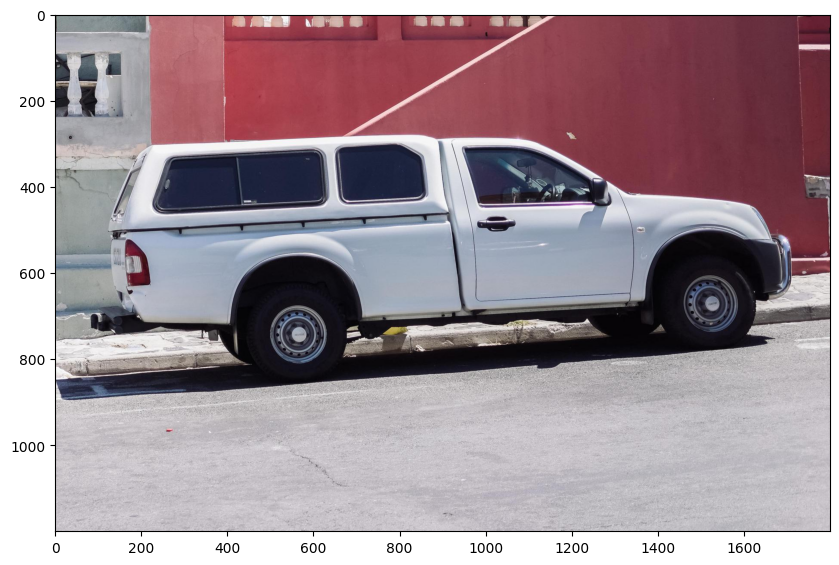

In [6]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("on")
plt.show()

In [7]:
np.random.seed(3)


def show_mask(mask, ax):
    color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor="green", facecolor=(0, 0, 0, 0), lw=2))


def show_masks(image, masks, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, mask in enumerate(masks):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        plt.axis("off")
        plt.show()

### Download and inference PyTorch model
[back to top ⬆️](#Table-of-contents:)


There are several [Segment Anything V2 Models](https://github.com/facebookresearch/segment-anything-2?tab=readme-ov-file#model-description) available for downloading. In this tutorial we will use model based on `sam2-hiera-large`, but the demonstrated approach is very general and applicable to other SAM models.


SAM2 provide image prediction APIs that closely resemble SAM for image use cases. The `SAM2ImagePredictor` class has an easy interface for image prompting. Also the model could be loaded by `SAM2ImagePredictor` from [HuggingFace](https://huggingface.co/facebook/sam2-hiera-large). List of other SAM2 models could be found [here](https://huggingface.co/models?search=facebook/sam2).

In [8]:
import torch
from sam2.sam2_image_predictor import SAM2ImagePredictor

predictor = SAM2ImagePredictor.from_pretrained("facebook/sam2-hiera-large", device="cpu")

In [9]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

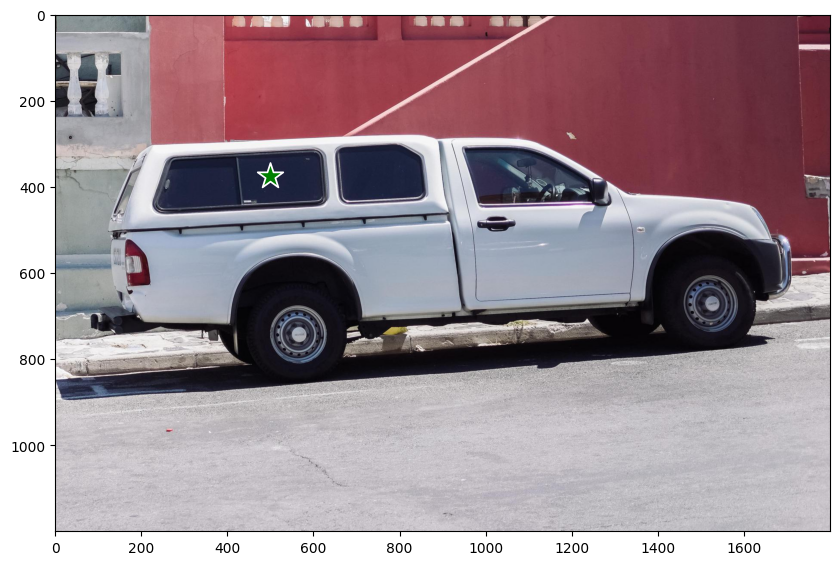

In [10]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("on")
plt.show()

In [11]:
predictor.set_image(image)

masks, scores, logits = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=False)

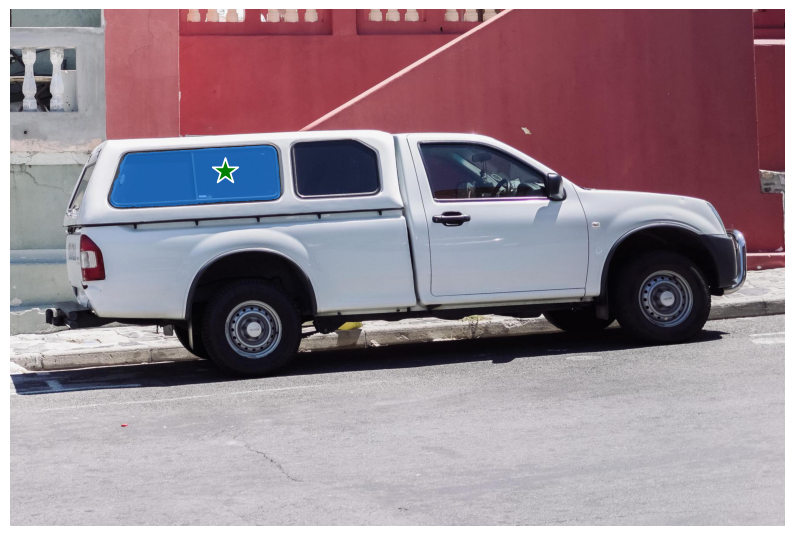

In [12]:
show_masks(image, masks, point_coords=input_point, input_labels=input_label)

In [13]:
predictor.reset_predictor()

### Convert model to OpenVINO Intermediate Representation
[back to top ⬆️](#Table-of-contents:)


#### Image Encoder
[back to top ⬆️](#Table-of-contents:)


The image encoder is only run once for the entire interaction and its role is to provide unconditioned tokens (feature embeddings) representing each frame. Then changing prompt, prompt encoder and mask decoder can be run multiple times to retrieve different objects from the same image. Taking into account this fact, we split model on 2 independent parts: image_encoder and mask_predictor (combination of Prompt Encoder and Mask Decoder).

Image Encoder input is tensor with shape `1x3x1024x1024` in `NCHW` format, contains image for segmentation.
Image Encoder output is image embeddings, tensor with shape `1x256x64x64`

In [14]:
class SamImageEncoderModel(torch.nn.Module):
    def __init__(self, predictor) -> None:
        super().__init__()
        self.image_encoder = predictor.model.image_encoder
        self.base_model = predictor.model
        self._bb_feat_sizes = predictor._bb_feat_sizes

    @torch.no_grad()
    def forward(
        self,
        image: torch.Tensor,
    ):
        # backbone_out = self.base_model.forward_image(image)
        backbone_out = self.image_encoder(image)

        _, vision_feats, _, _ = self.base_model._prepare_backbone_features(backbone_out)
        # Add no_mem_embed, which is added to the lowest rest feat. map during training on videos
        if self.base_model.directly_add_no_mem_embed:
            vision_feats[-1] = vision_feats[-1] + self.base_model.no_mem_embed

        feats = [feat.permute(1, 2, 0).view(1, -1, *feat_size) for feat, feat_size in zip(vision_feats[::-1], self._bb_feat_sizes[::-1])][::-1]

        return feats[-1], feats[:-1]

In [15]:
import warnings
from pathlib import Path
import torch
import openvino as ov

core = ov.Core()

ov_encoder_path = Path("sam_image_encoder.xml")
if not ov_encoder_path.exists():
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)

        image_encoder = SamImageEncoderModel(predictor)
        ov_encoder_model = ov.convert_model(
            image_encoder,
            example_input=torch.zeros(1, 3, 1024, 1024),
            input=([1, 3, 1024, 1024],),
        )
    ov.save_model(ov_encoder_model, ov_encoder_path)
else:
    ov_encoder_model = core.read_model(ov_encoder_path)

In [16]:
import ipywidgets as widgets

device = widgets.Dropdown(
    options=core.available_devices + ["AUTO"],
    value="AUTO",
    description="Device:",
    disabled=False,
)

device

Dropdown(description='Device:', index=1, options=('CPU', 'AUTO'), value='AUTO')

In [17]:
ov_encoder = core.compile_model(ov_encoder_model, device.value)

#### Mask predictor
[back to top ⬆️](#Table-of-contents:)

Mask prediction will be includes two models:
* **Prompt Encoder** - Encoder for segmentation condition. As a condition can be used points, boxes or segmentation mask.
* **Mask Decoder** - The mask decoder efficiently maps the image embedding, prompt embeddings, and an output token to a mask.

Combined prompt encoder and mask decoder model has following list of inputs:

* `image_embeddings`: The image embedding from `image_encoder`. Has a batch index of length 1.
* `point_coords`: Coordinates of sparse input prompts, corresponding to both point inputs and box inputs. Boxes are encoded using two points, one for the top-left corner and one for the bottom-right corner. *Coordinates must already be transformed to long-side 1024.* Has a batch index of length 1.
* `point_labels`: Labels for the sparse input prompts. 0 is a negative input point, 1 is a positive input point, 2 is a top-left box corner, 3 is a bottom-right box corner, and -1 is a padding point. *If there is no box input, a single padding point with label -1 and coordinates (0.0, 0.0) should be concatenated.


Model outputs:

* `masks` - predicted masks resized to original image size, to obtain a binary mask, should be compared with `threshold` (usually equal 0.0).
* `iou_predictions` - intersection over union predictions
* `low_res_masks` - predicted masks before postprocessing, can be used as mask input for model.

In [32]:
class SamExportableModel(torch.nn.Module):
    def __init__(
        self, model, multimask_output: bool, use_stability_score: bool = False, return_extra_metrics: bool = False, use_high_res_features: bool = False
    ) -> None:
        super().__init__()
        self.mask_decoder = model.sam_mask_decoder
        self.mask_decoder.use_high_res_features = use_high_res_features
        self.model = model
        self.model.use_high_res_features_in_sam = use_high_res_features
        self.img_size = model.image_size
        self.multimask_output = multimask_output
        self.use_stability_score = use_stability_score
        self.stability_score_offset = 1.0
        self.return_extra_metrics = return_extra_metrics
        self.prompt_encoder = model.sam_prompt_encoder

    def _embed_points(self, point_coords: torch.Tensor, point_labels: torch.Tensor) -> torch.Tensor:
        point_coords = point_coords + 0.5
        point_coords = point_coords / self.img_size
        point_embedding = self.prompt_encoder.pe_layer._pe_encoding(point_coords)
        point_labels = point_labels.unsqueeze(-1).expand_as(point_embedding)

        point_embedding = point_embedding * (point_labels != -1).to(torch.float32)
        point_embedding = point_embedding + self.prompt_encoder.not_a_point_embed.weight * (point_labels == -1).to(torch.float32)

        for i in range(self.prompt_encoder.num_point_embeddings):
            point_embedding = point_embedding + self.prompt_encoder.point_embeddings[i].weight * (point_labels == i).to(torch.float32)

        return point_embedding

    def _batched_mode(self, point_coords: torch.Tensor, point_labels: torch.Tensor):
        point_coords = point_coords + 0.5
        point_coords = point_coords / self.img_size
        point_embedding = self.prompt_encoder.pe_layer._pe_encoding(point_coords)
        point_labels = point_labels.unsqueeze(-1).expand_as(point_embedding)

        concat_points = (point_coords, point_labels)
        batched_mode = concat_points is not None and concat_points[0].shape[0] > 1  # multi object prediction

        return batched_mode

    def t_embed_masks(self, input_mask: torch.Tensor) -> torch.Tensor:
        mask_embedding = self.prompt_encoder.mask_downscaling(input_mask)
        return mask_embedding

    def mask_postprocessing(self, masks: torch.Tensor) -> torch.Tensor:
        masks = torch.nn.functional.interpolate(
            masks,
            size=(self.img_size, self.img_size),
            mode="bilinear",
            align_corners=False,
        )
        return masks

    @torch.no_grad()
    def forward(
        self,
        image_embeddings: torch.Tensor,
        point_coords: torch.Tensor,
        point_labels: torch.Tensor,
        high_res_feats_256: torch.Tensor = None,
        high_res_feats_128: torch.Tensor = None,
    ):
        mask_input = None
        sparse_embedding = self._embed_points(point_coords, point_labels)
        if mask_input is None:
            dense_embedding = self.prompt_encoder.no_mask_embed.weight.reshape(1, -1, 1, 1).expand(point_coords.shape[0], -1, image_embeddings.shape[0], 64)
        else:
            dense_embedding = self._embed_masks(mask_input)

        batched_mode = self._batched_mode(point_coords, point_labels)

        low_res_masks, iou_pred, _, _ = self.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embedding,
            dense_prompt_embeddings=dense_embedding,
            multimask_output=self.multimask_output,
            repeat_image=batched_mode,
            high_res_features=[high_res_feats_256, high_res_feats_128],
        )

        if self.use_stability_score:
            iou_pred = calculate_stability_score(low_res_masks, self.model.mask_threshold, self.stability_score_offset)

        upscaled_masks = self.mask_postprocessing(low_res_masks)

        if self.return_extra_metrics:
            stability_scores = calculate_stability_score(upscaled_masks, self.model.mask_threshold, self.stability_score_offset)
            areas = (upscaled_masks > self.model.mask_threshold).sum(-1).sum(-1)
            return upscaled_masks, low_res_masks, stability_scores, areas

        low_res_masks = torch.clamp(low_res_masks, -32.0, 32.0)

        return upscaled_masks, iou_pred, low_res_masks

In [33]:
ov_mask_predictor_path = Path("ov_mask_predictor.xml")
if not ov_mask_predictor_path.exists():
    exportable_model = SamExportableModel(predictor.model, multimask_output=False, use_high_res_features=False)
    embed_dim = predictor.model.sam_prompt_encoder.embed_dim
    embed_size = predictor.model.sam_prompt_encoder.image_embedding_size

    hf_sizes = predictor._bb_feat_sizes

    dummy_inputs = {
        "image_embeddings": torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
        # "high_res_feats_256": torch.randn(1, 32, *hf_sizes[0], dtype=torch.float),
        # "high_res_feats_128": torch.randn(1, 64, *hf_sizes[1], dtype=torch.float),
        "point_coords": torch.randint(low=0, high=1024, size=(1, 5, 2), dtype=torch.float),
        "point_labels": torch.randint(low=0, high=4, size=(1, 5), dtype=torch.float),
    }
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)
        ov_mask_predictor_model = ov.convert_model(exportable_model, example_input=dummy_inputs)
    ov.save_model(ov_mask_predictor_model, ov_mask_predictor_path)
else:
    ov_mask_predictor_model = core.read_model(ov_mask_predictor_path)

In [34]:
ov_predictor = core.compile_model(ov_mask_predictor_model, device.value)

### Run OpenVINO model in interactive segmentation mode
[back to top ⬆️](#Table-of-contents:)


#### Example Image
[back to top ⬆️](#Table-of-contents:)


In [35]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

download_file("https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg")
image = cv2.imread("truck.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

'truck.jpg' already exists.


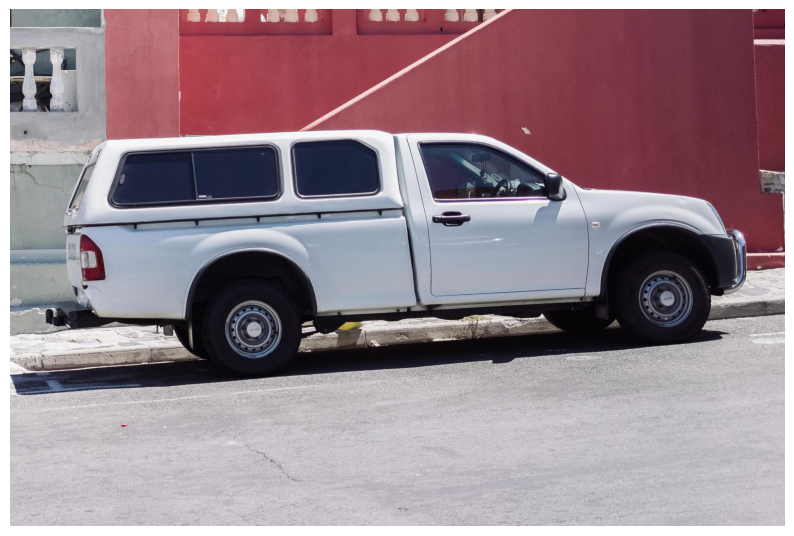

In [36]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.show()

#### Preprocessing and visualization utilities
[back to top ⬆️](#Table-of-contents:)

To prepare input for Image Encoder we should:

1. Convert BGR image to RGB
2. Resize image saving aspect ratio where longest size equal to Image Encoder input size - 1024.
3. Normalize image subtract mean values (123.675, 116.28, 103.53) and divide by std (58.395, 57.12, 57.375)
4. Transpose HWC data layout to CHW and add batch dimension.
5. Add zero padding to input tensor by height or width (depends on aspect ratio) according Image Encoder expected input shape.

These steps are applicable to all available models

In [37]:
from copy import deepcopy
from typing import Tuple
from torchvision.transforms.functional import resize, to_pil_image


class ResizeLongestSide:
    """
    Resizes images to longest side 'target_length', as well as provides
    methods for resizing coordinates and boxes. Provides methods for
    transforming numpy arrays.
    """

    def __init__(self, target_length: int) -> None:
        self.target_length = target_length

    def apply_image(self, image: np.ndarray) -> np.ndarray:
        """
        Expects a numpy array with shape HxWxC in uint8 format.
        """
        target_size = self.get_preprocess_shape(image.shape[0], image.shape[1], self.target_length)
        return np.array(resize(to_pil_image(image), target_size))

    def apply_coords(self, coords: np.ndarray, original_size: Tuple[int, ...]) -> np.ndarray:
        """
        Expects a numpy array of length 2 in the final dimension. Requires the
        original image size in (H, W) format.
        """
        old_h, old_w = original_size
        new_h, new_w = self.get_preprocess_shape(original_size[0], original_size[1], self.target_length)
        coords = deepcopy(coords).astype(float)
        coords[..., 0] = coords[..., 0] * (new_w / old_w)
        coords[..., 1] = coords[..., 1] * (new_h / old_h)
        return coords

    def apply_boxes(self, boxes: np.ndarray, original_size: Tuple[int, ...]) -> np.ndarray:
        """
        Expects a numpy array shape Bx4. Requires the original image size
        in (H, W) format.
        """
        boxes = self.apply_coords(boxes.reshape(-1, 2, 2), original_size)
        return boxes.reshape(-1, 4)

    @staticmethod
    def get_preprocess_shape(oldh: int, oldw: int, long_side_length: int) -> Tuple[int, int]:
        """
        Compute the output size given input size and target long side length.
        """
        scale = long_side_length * 1.0 / max(oldh, oldw)
        newh, neww = oldh * scale, oldw * scale
        neww = int(neww + 0.5)
        newh = int(newh + 0.5)
        return (newh, neww)


resizer = ResizeLongestSide(1024)


def preprocess_image(image: np.ndarray):
    resized_image = resizer.apply_image(image)
    resized_image = (resized_image.astype(np.float32) - [123.675, 116.28, 103.53]) / [
        58.395,
        57.12,
        57.375,
    ]
    resized_image = np.expand_dims(np.transpose(resized_image, (2, 0, 1)).astype(np.float32), 0)

    # Pad
    h, w = resized_image.shape[-2:]
    padh = 1024 - h
    padw = 1024 - w
    x = np.pad(resized_image, ((0, 0), (0, 0), (0, padh), (0, padw)))
    return x


def postprocess_masks(masks: np.ndarray, orig_size):
    size_before_pad = resizer.get_preprocess_shape(orig_size[0], orig_size[1], masks.shape[-1])
    masks = masks[..., : int(size_before_pad[0]), : int(size_before_pad[1])]
    masks = torch.nn.functional.interpolate(torch.from_numpy(masks), size=orig_size, mode="bilinear", align_corners=False).numpy()
    return masks

#### Image encoding
[back to top ⬆️](#Table-of-contents:)

To start work with image, we should preprocess it and obtain image embeddings using `ov_encoder`. We will use the same image for all experiments, so it is possible to generate image embedding once and then reuse them.

In [38]:
preprocessed_image = preprocess_image(image)
encoding_results = ov_encoder(preprocessed_image)

Now, we can try to provide different prompts for mask generation

#### Example point input
[back to top ⬆️](#Table-of-contents:)

In this example we select one point. The green star symbol show its location on the image below.

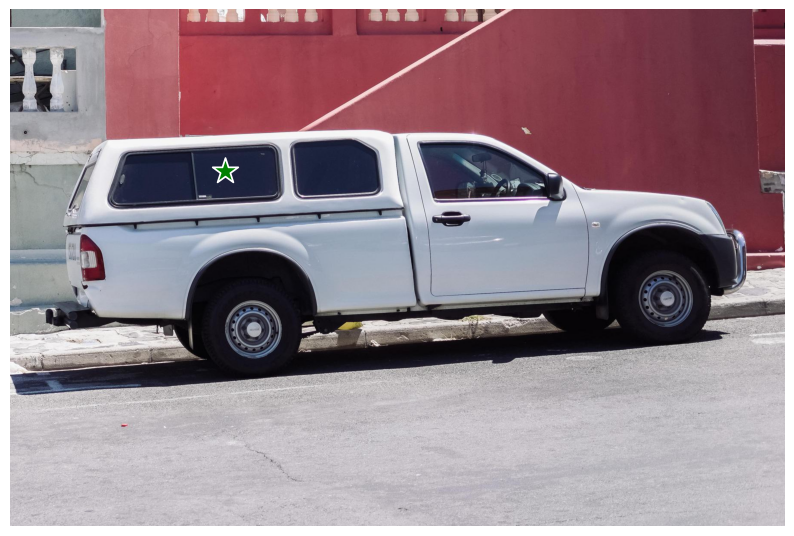

In [39]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Add a batch index, concatenate a padding point, and transform it to input tensor coordinate system.

In [40]:
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)
coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package the inputs to run in the mask predictor.

In [41]:
inputs = {
    "image_embeddings": torch.from_numpy(encoding_results[ov_encoder.output(0)]),
    # "high_res_feats_256": torch.from_numpy(encoding_results[ov_encoder.output(1)]),
    # "high_res_feats_128": torch.from_numpy(encoding_results[ov_encoder.output(2)]),
    "point_coords": coord,
    "point_labels": label,
}

Predict a mask and threshold it to get binary mask (0 - no object, 1 - object).

In [42]:
results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1])

masks = masks > 0.0

In [43]:
mask = masks[0]
mask = np.transpose(mask, (1, 2, 0))
print(mask.shape)

(1200, 1800, 1)


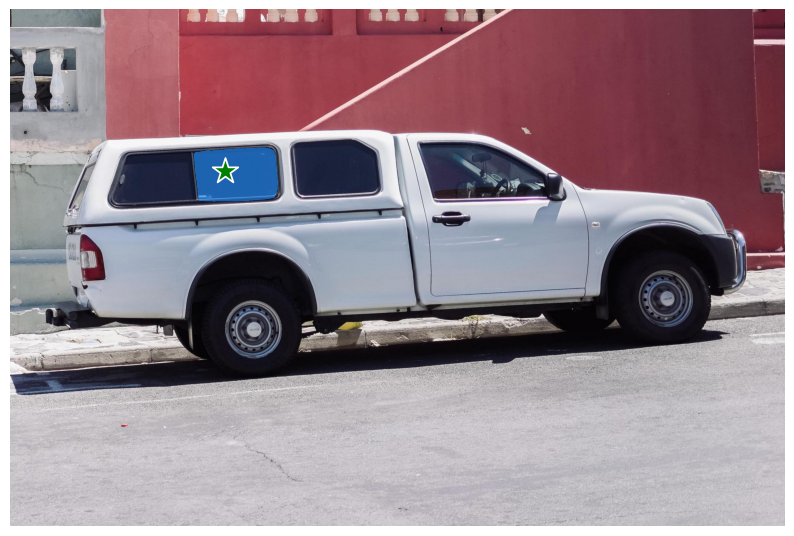

In [44]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

#### Example with multiple points
[back to top ⬆️](#Table-of-contents:)

in this example, we provide additional point for cover larger object area.

In [45]:
input_point = np.array([[500, 375], [1125, 625], [575, 750], [1405, 575]])
input_label = np.array([1, 1, 1, 1])

Now, prompt for model looks like represented on this image:

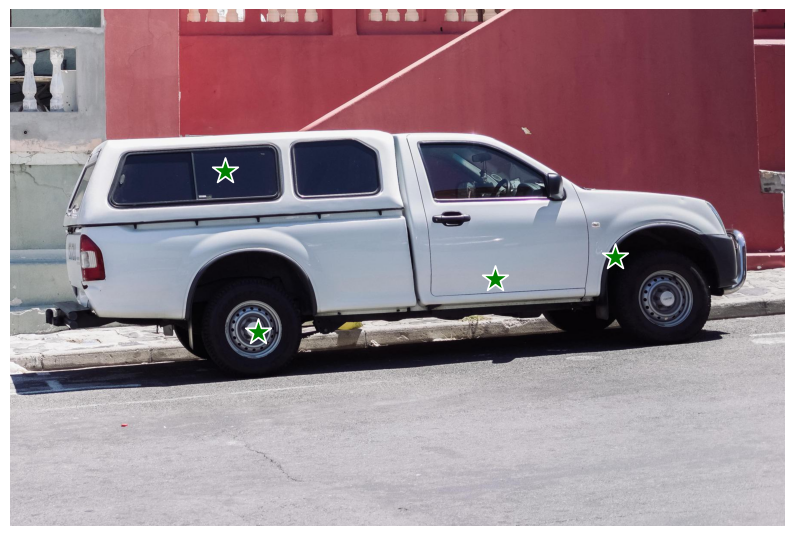

In [46]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Transform the points as in the previous example.

In [47]:
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package inputs, then predict and threshold the mask.

In [48]:
inputs = {
    "image_embeddings": encoding_results[ov_encoder.output(0)],
    # "high_res_feats_256": encoding_results[ov_encoder.output(1)],
    # "high_res_feats_128": encoding_results[ov_encoder.output(2)],
    "point_coords": coord,
    "point_labels": label,
}

results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1])
masks = masks > 0.0

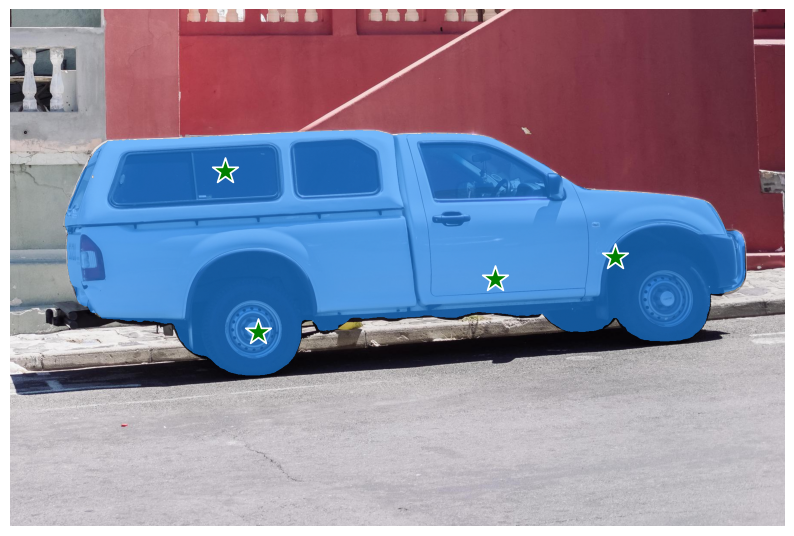

In [49]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Great! Looks like now, predicted mask cover whole truck.

#### Example box and point input with negative label
[back to top ⬆️](#Table-of-contents:)

In this example we define input prompt using bounding box and point inside it.The bounding box represented as set of points of its left upper corner and right lower corner. Label 0 for point speak that this point should be excluded from mask.

In [50]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

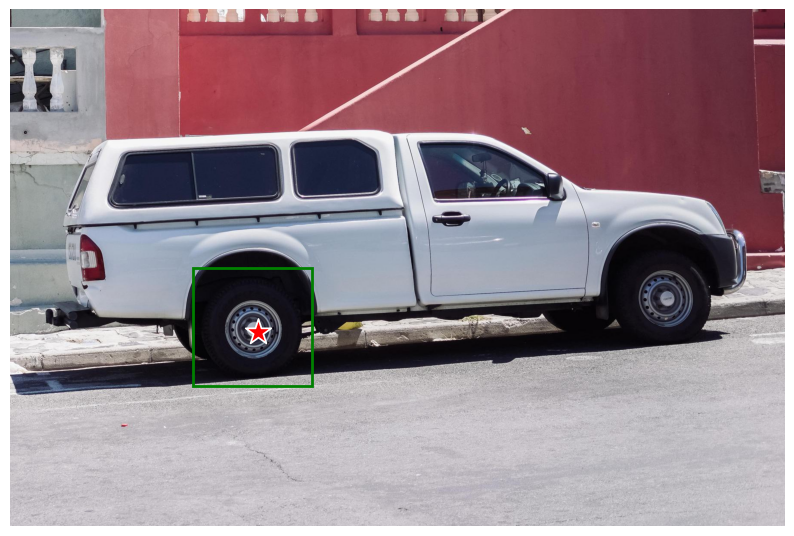

In [51]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Add a batch index, concatenate a box and point inputs, add the appropriate labels for the box corners, and transform. There is no padding point since the input includes a box input.

In [52]:
box_coords = input_box.reshape(2, 2)
box_labels = np.array([2, 3])

coord = np.concatenate([input_point, box_coords], axis=0)[None, :, :]
label = np.concatenate([input_label, box_labels], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package inputs, then predict and threshold the mask.

In [53]:
inputs = {
    "image_embeddings": encoding_results[ov_encoder.output(0)],
    # "high_res_feats_1": encoding_results[ov_encoder.output(1)],
    # "high_res_feats_2": encoding_results[ov_encoder.output(2)],
    "point_coords": coord,
    "point_labels": label,
}

results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1])
masks = masks > 0.0

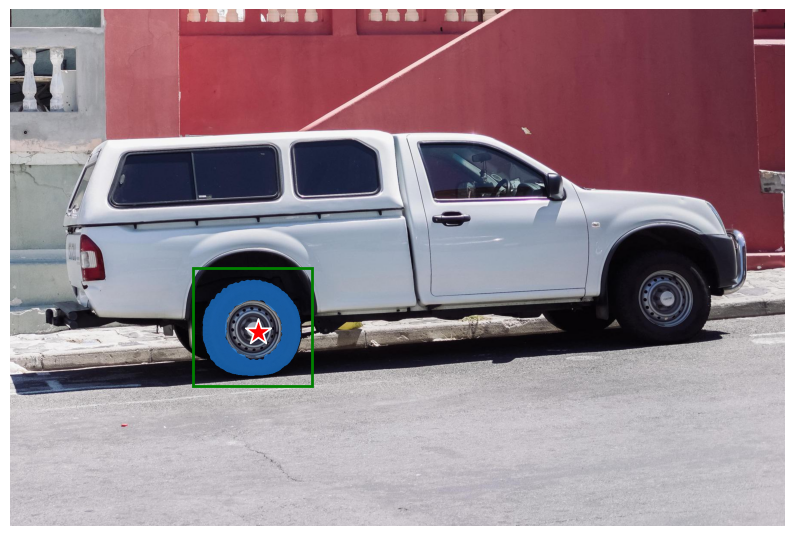

In [54]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

### Interactive segmentation
[back to top ⬆️](#Table-of-contents:)

Now, you can try SAM on own image. Upload image to input window and click on desired point, model predict segment based on your image and point. 

In [55]:
class Segmenter:
    def __init__(self, ov_encoder, ov_predictor):
        self.encoder = ov_encoder
        self.predictor = ov_predictor
        self._img_embeddings = None

    def set_image(self, img: np.ndarray):
        if self._img_embeddings is not None:
            del self._img_embeddings
        preprocessed_image = preprocess_image(img)
        encoding_results = self.encoder(preprocessed_image)
        image_embeddings = encoding_results[ov_encoder.output(0)]
        self._img_embeddings = image_embeddings
        return img

    def get_mask(self, points, img):
        coord = np.array(points)
        coord = np.concatenate([coord, np.array([[0, 0]])], axis=0)
        coord = coord[None, :, :]
        label = np.concatenate([np.ones(len(points)), np.array([-1])], axis=0)[None, :].astype(np.float32)
        coord = resizer.apply_coords(coord, img.shape[:2]).astype(np.float32)
        if self._img_embeddings is None:
            self.set_image(img)
        inputs = {
            "image_embeddings": self._img_embeddings,
            "point_coords": coord,
            "point_labels": label,
        }

        results = self.predictor(inputs)
        masks = results[ov_predictor.output(0)]
        masks = postprocess_masks(masks, img.shape[:-1])

        masks = masks > 0.0
        mask = masks[0]
        mask = np.transpose(mask, (1, 2, 0))
        return mask


segmenter = Segmenter(ov_encoder, ov_predictor)

In [ ]:
if not Path("gradio_helper.py").exists():
    r = requests.get(url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/segment-anything/gradio_helper.py")
    open("gradio_helper.py", "w").write(r.text)

from gradio_helper import make_demo

demo = make_demo(segmenter)

try:
    demo.launch()
except Exception:
    demo.launch(share=True)
# If you are launching remotely, specify server_name and server_port
# EXAMPLE: `demo.launch(server_name="your server name", server_port="server port in int")`
# To learn more please refer to the Gradio docs: https://gradio.app/docs/

## Run OpenVINO model in automatic mask generation mode
[back to top ⬆️](#Table-of-contents:)

Since SAM2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.
`automatic_mask_generation` function implements this capability.
It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [57]:
from sam2.utils.amg import (
    MaskData,
    generate_crop_boxes,
    uncrop_boxes_xyxy,
    uncrop_masks,
    uncrop_points,
    calculate_stability_score,
    rle_to_mask,
    batched_mask_to_box,
    mask_to_rle_pytorch,
    is_box_near_crop_edge,
    batch_iterator,
    remove_small_regions,
    build_all_layer_point_grids,
    box_xyxy_to_xywh,
    area_from_rle,
)
from torchvision.ops.boxes import batched_nms, box_area
from typing import Tuple, List, Dict, Any

In [58]:
def process_batch(
    image_embedding: np.ndarray,
    points: np.ndarray,
    im_size: Tuple[int, ...],
    crop_box: List[int],
    orig_size: Tuple[int, ...],
    iou_thresh,
    mask_threshold,
    stability_score_offset,
    stability_score_thresh,
    normalize=False,
) -> MaskData:
    orig_h, orig_w = orig_size

    #     # Run model on this batch
    transformed_points = resizer.apply_coords(points, im_size)
    in_points = transformed_points
    in_labels = np.ones(in_points.shape[0], dtype=int)

    inputs = {
        "image_embeddings": image_embedding,
        "point_coords": in_points[:, None, :],
        "point_labels": in_labels[:, None],
    }
    res = ov_predictor(inputs)
    masks = postprocess_masks(res[ov_predictor.output(0)], orig_size)

    masks = torch.from_numpy(masks)
    iou_preds = torch.from_numpy(res[ov_predictor.output(1)])

    # Serialize predictions and store in MaskData
    data = MaskData(
        masks=masks.flatten(0, 1),
        iou_preds=iou_preds.flatten(0, 1),
        points=torch.as_tensor(points.repeat(masks.shape[1], axis=0)),
        low_res_masks=res[ov_predictor.output(2)],
    )
    del masks

    # Filter by predicted IoU
    if iou_thresh > 0.0:
        keep_mask = data["iou_preds"] > iou_thresh
        data.filter(keep_mask)

    # Calculate and filter by stability score
    data["stability_score"] = calculate_stability_score(data["masks"], mask_threshold, stability_score_offset)
    if stability_score_thresh > 0.0:
        keep_mask = data["stability_score"] >= stability_score_thresh
        data.filter(keep_mask)

    # Threshold masks and calculate boxes
    data["masks"] = data["masks"] > mask_threshold
    data["boxes"] = batched_mask_to_box(data["masks"])

    # Filter boxes that touch crop boundaries
    keep_mask = ~is_box_near_crop_edge(data["boxes"], crop_box, [0, 0, orig_w, orig_h])
    if not torch.all(keep_mask):
        data.filter(keep_mask)

    # Compress to RLE
    data["masks"] = uncrop_masks(data["masks"], crop_box, orig_h, orig_w)
    data["rles"] = mask_to_rle_pytorch(data["masks"])
    del data["masks"]

    return data

In [59]:
def process_crop(
    image: np.ndarray,
    point_grids,
    crop_box: List[int],
    crop_layer_idx: int,
    orig_size: Tuple[int, ...],
    box_nms_thresh: float = 0.7,
    mask_threshold: float = 0.0,
    points_per_batch: int = 64,
    pred_iou_thresh: float = 0.88,
    stability_score_thresh: float = 0.95,
    stability_score_offset: float = 1.0,
) -> MaskData:
    # Crop the image and calculate embeddings
    x0, y0, x1, y1 = crop_box
    cropped_im = image[y0:y1, x0:x1, :]
    cropped_im_size = cropped_im.shape[:2]
    preprocessed_cropped_im = preprocess_image(cropped_im)
    crop_embeddings = ov_encoder(preprocessed_cropped_im)[ov_encoder.output(0)]

    # Get points for this crop
    points_scale = np.array(cropped_im_size)[None, ::-1]
    points_for_image = point_grids[crop_layer_idx] * points_scale

    # Generate masks for this crop in batches
    data = MaskData()
    for (points,) in batch_iterator(points_per_batch, points_for_image):
        batch_data = process_batch(
            crop_embeddings,
            points,
            cropped_im_size,
            crop_box,
            orig_size,
            pred_iou_thresh,
            mask_threshold,
            stability_score_offset,
            stability_score_thresh,
        )
        data.cat(batch_data)
        del batch_data

    # Remove duplicates within this crop.
    keep_by_nms = batched_nms(
        data["boxes"].float(),
        data["iou_preds"],
        torch.zeros_like(data["boxes"][:, 0]),  # categories
        iou_threshold=box_nms_thresh,
    )
    data.filter(keep_by_nms)

    # Return to the original image frame
    data["boxes"] = uncrop_boxes_xyxy(data["boxes"], crop_box)
    data["points"] = uncrop_points(data["points"], crop_box)
    data["crop_boxes"] = torch.tensor([crop_box for _ in range(len(data["rles"]))])

    return data

In [60]:
def generate_masks(image: np.ndarray, point_grids, crop_n_layers, crop_overlap_ratio, crop_nms_thresh) -> MaskData:
    orig_size = image.shape[:2]
    crop_boxes, layer_idxs = generate_crop_boxes(orig_size, crop_n_layers, crop_overlap_ratio)

    # Iterate over image crops
    data = MaskData()
    for crop_box, layer_idx in zip(crop_boxes, layer_idxs):
        crop_data = process_crop(image, point_grids, crop_box, layer_idx, orig_size)
        data.cat(crop_data)

    # Remove duplicate masks between crops
    if len(crop_boxes) > 1:
        # Prefer masks from smaller crops
        scores = 1 / box_area(data["crop_boxes"])
        scores = scores.to(data["boxes"].device)
        keep_by_nms = batched_nms(
            data["boxes"].float(),
            scores,
            torch.zeros_like(data["boxes"][:, 0]),  # categories
            crop_nms_thresh,
        )
        data.filter(keep_by_nms)
    data.to_numpy()
    return data

In [61]:
def postprocess_small_regions(mask_data: MaskData, min_area: int, nms_thresh: float) -> MaskData:
    """
    Removes small disconnected regions and holes in masks, then reruns
    box NMS to remove any new duplicates.

    Edits mask_data in place.

    Requires open-cv as a dependency.
    """
    if len(mask_data["rles"]) == 0:
        return mask_data

    # Filter small disconnected regions and holes
    new_masks = []
    scores = []
    for rle in mask_data["rles"]:
        mask = rle_to_mask(rle)

        mask, changed = remove_small_regions(mask, min_area, mode="holes")
        unchanged = not changed
        mask, changed = remove_small_regions(mask, min_area, mode="islands")
        unchanged = unchanged and not changed

        new_masks.append(torch.as_tensor(mask).unsqueeze(0))
        # Give score=0 to changed masks and score=1 to unchanged masks
        # so NMS will prefer ones that didn't need postprocessing
        scores.append(float(unchanged))

    # Recalculate boxes and remove any new duplicates
    masks = torch.cat(new_masks, dim=0)
    boxes = batched_mask_to_box(masks)
    keep_by_nms = batched_nms(
        boxes.float(),
        torch.as_tensor(scores),
        torch.zeros_like(boxes[:, 0]),  # categories
        iou_threshold=nms_thresh,
    )

    # Only recalculate RLEs for masks that have changed
    for i_mask in keep_by_nms:
        if scores[i_mask] == 0.0:
            mask_torch = masks[i_mask].unsqueeze(0)
            mask_data["rles"][i_mask] = mask_to_rle_pytorch(mask_torch)[0]
            mask_data["boxes"][i_mask] = boxes[i_mask]  # update res directly
    mask_data.filter(keep_by_nms)

    return mask_data

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes

In [62]:
def automatic_mask_generation(
    image: np.ndarray,
    min_mask_region_area: int = 0,
    points_per_side: int = 32,
    crop_n_layers: int = 0,
    crop_n_points_downscale_factor: int = 1,
    crop_overlap_ratio: float = 512 / 1500,
    box_nms_thresh: float = 0.7,
    crop_nms_thresh: float = 0.7,
) -> List[Dict[str, Any]]:
    """
    Generates masks for the given image.

    Arguments:
      image (np.ndarray): The image to generate masks for, in HWC uint8 format.

    Returns:
       list(dict(str, any)): A list over records for masks. Each record is
         a dict containing the following keys:
           segmentation (dict(str, any) or np.ndarray): The mask. If
             output_mode='binary_mask', is an array of shape HW. Otherwise,
             is a dictionary containing the RLE.
           bbox (list(float)): The box around the mask, in XYWH format.
           area (int): The area in pixels of the mask.
           predicted_iou (float): The model's own prediction of the mask's
             quality. This is filtered by the pred_iou_thresh parameter.
           point_coords (list(list(float))): The point coordinates input
             to the model to generate this mask.
           stability_score (float): A measure of the mask's quality. This
             is filtered on using the stability_score_thresh parameter.
           crop_box (list(float)): The crop of the image used to generate
             the mask, given in XYWH format.
    """
    point_grids = build_all_layer_point_grids(
        points_per_side,
        crop_n_layers,
        crop_n_points_downscale_factor,
    )

    mask_data = generate_masks(image, point_grids, crop_n_layers, crop_overlap_ratio, crop_nms_thresh)

    # Filter small disconnected regions and holes in masks
    if min_mask_region_area > 0:
        mask_data = postprocess_small_regions(
            mask_data,
            min_mask_region_area,
            max(box_nms_thresh, crop_nms_thresh),
        )

    mask_data["segmentations"] = [rle_to_mask(rle) for rle in mask_data["rles"]]

    # Write mask records
    curr_anns = []
    for idx in range(len(mask_data["segmentations"])):
        ann = {
            "segmentation": mask_data["segmentations"][idx],
            "area": area_from_rle(mask_data["rles"][idx]),
            "bbox": box_xyxy_to_xywh(mask_data["boxes"][idx]).tolist(),
            "predicted_iou": mask_data["iou_preds"][idx].item(),
            "point_coords": [mask_data["points"][idx].tolist()],
            "stability_score": mask_data["stability_score"][idx].item(),
            "crop_box": box_xyxy_to_xywh(mask_data["crop_boxes"][idx]).tolist(),
        }
        curr_anns.append(ann)

    return curr_anns

In [63]:
prediction = automatic_mask_generation(image)

`automatic_mask_generation` returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:

* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [64]:
print(f"Number of detected masks: {len(prediction)}")
print(f"Annotation keys: {prediction[0].keys()}")

Number of detected masks: 14
Annotation keys: dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


In [65]:
from tqdm.notebook import tqdm


def draw_anns(image, anns):
    if len(anns) == 0:
        return
    segments_image = image.copy()
    sorted_anns = sorted(anns, key=(lambda x: x["area"]), reverse=True)
    for ann in tqdm(sorted_anns):
        mask = ann["segmentation"]
        mask_color = np.random.randint(0, 255, size=(1, 1, 3)).astype(np.uint8)
        segments_image[mask] = mask_color
    return cv2.addWeighted(image.astype(np.float32), 0.7, segments_image.astype(np.float32), 0.3, 0.0)

  0%|          | 0/14 [00:00<?, ?it/s]

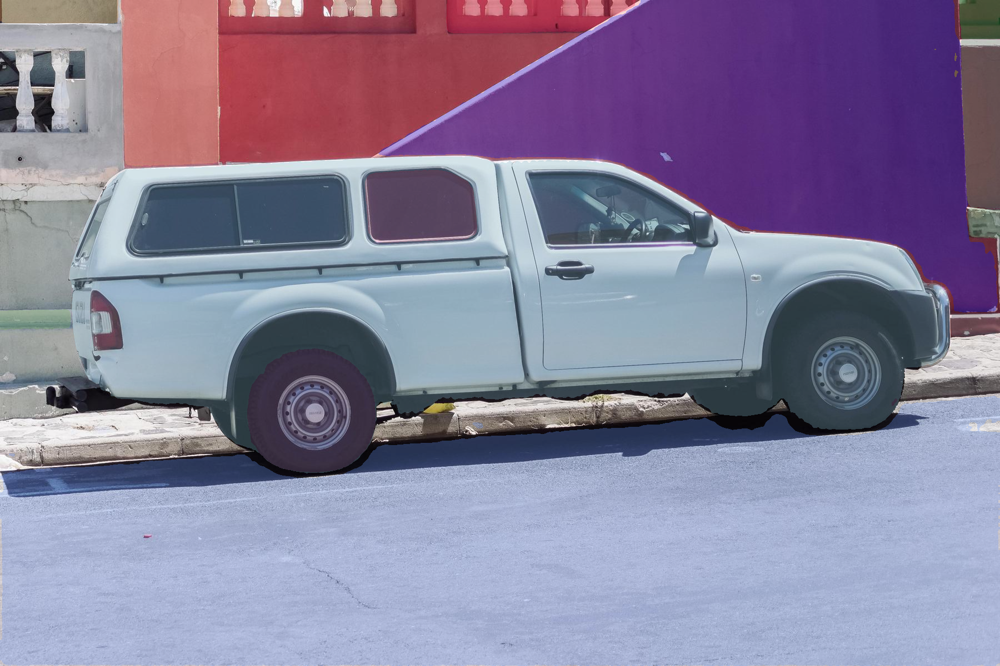

In [66]:
import PIL

out = draw_anns(image, prediction)
cv2.imwrite("result.png", out[:, :, ::-1])

PIL.Image.open("result.png")

## Optimize encoder using NNCF Post-training Quantization API
[back to top ⬆️](#Table-of-contents:)

[NNCF](https://github.com/openvinotoolkit/nncf) provides a suite of advanced algorithms for Neural Networks inference optimization in OpenVINO with minimal accuracy drop.

Since encoder costing much more time than other parts in SAM2 inference pipeline, we will use 8-bit quantization in post-training mode (without the fine-tuning pipeline) to optimize encoder of SAM2.

The optimization process contains the following steps:

1. Create a Dataset for quantization.
2. Run `nncf.quantize` for getting an optimized model.
3. Serialize OpenVINO IR model, using the `openvino.save_model` function.

### Prepare a calibration dataset
[back to top ⬆️](#Table-of-contents:)

Download COCO dataset. Since the dataset is used to calibrate the model's parameter instead of fine-tuning it, we don't need to download the label files.

In [67]:
from zipfile import ZipFile

DATA_URL = "https://ultralytics.com/assets/coco128.zip"
OUT_DIR = Path(".")

download_file(DATA_URL, directory=OUT_DIR, show_progress=True)

if not (OUT_DIR / "coco128/images/train2017").exists():
    with ZipFile("coco128.zip", "r") as zip_ref:
        zip_ref.extractall(OUT_DIR)

'coco128.zip' already exists.


Create an instance of the `nncf.Dataset` class that represents the calibration dataset. For PyTorch, we can pass an instance of the `torch.utils.data.DataLoader` object.

In [68]:
import torch.utils.data as data


class COCOLoader(data.Dataset):
    def __init__(self, images_path):
        self.images = list(Path(images_path).iterdir())

    def __getitem__(self, index):
        image_path = self.images[index]
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def __len__(self):
        return len(self.images)


coco_dataset = COCOLoader(OUT_DIR / "coco128/images/train2017")
calibration_loader = torch.utils.data.DataLoader(coco_dataset)

The transformation function is a function that takes a sample from the dataset and returns data that can be passed to the model for inference.

In [69]:
import nncf


def transform_fn(image_data):
    """
    Quantization transform function. Extracts and preprocess input data from dataloader item for quantization.
    Parameters:
        image_data: image data produced by DataLoader during iteration
    Returns:
        input_tensor: input data in Dict format for model quantization
    """
    image = image_data.numpy()
    processed_image = preprocess_image(np.squeeze(image))
    return processed_image


calibration_dataset = nncf.Dataset(calibration_loader, transform_fn)

INFO:nncf:NNCF initialized successfully. Supported frameworks detected: torch, openvino


### Run quantization and serialize OpenVINO IR model
[back to top ⬆️](#Table-of-contents:)

The `nncf.quantize` function provides an interface for model quantization. It requires an instance of the OpenVINO Model and quantization dataset. It is available for models in the following frameworks: `PyTorch`, `TensorFlow 2.x`, `ONNX`, and `OpenVINO IR`. 

Optionally, some additional parameters for the configuration quantization process (number of samples for quantization, preset, model type, etc.) can be provided. `model_type` can be used to specify quantization scheme required for specific type of the model. For example, Transformer models such as SAM require a special quantization scheme to preserve accuracy after quantization. To achieve a better result, we will use a `mixed` quantization preset. It provides symmetric quantization of weights and asymmetric quantization of activations.

>**Note**: Model post-training quantization is time-consuming process. Be patient, it can take several minutes depending on your hardware.

In [ ]:
model = core.read_model(ov_encoder_path)
quantized_model = nncf.quantize(
    model,
    calibration_dataset,
    model_type=nncf.parameters.ModelType.TRANSFORMER,
    subset_size=128,
)
print("model quantization finished")

In [71]:
ov_encoder_path_int8 = "sam_image_encoder_int8.xml"
ov.save_model(quantized_model, ov_encoder_path_int8)

### Validate Quantized Model Inference
[back to top ⬆️](#Table-of-contents:)

We can reuse the previous code to validate the output of `INT8` model.

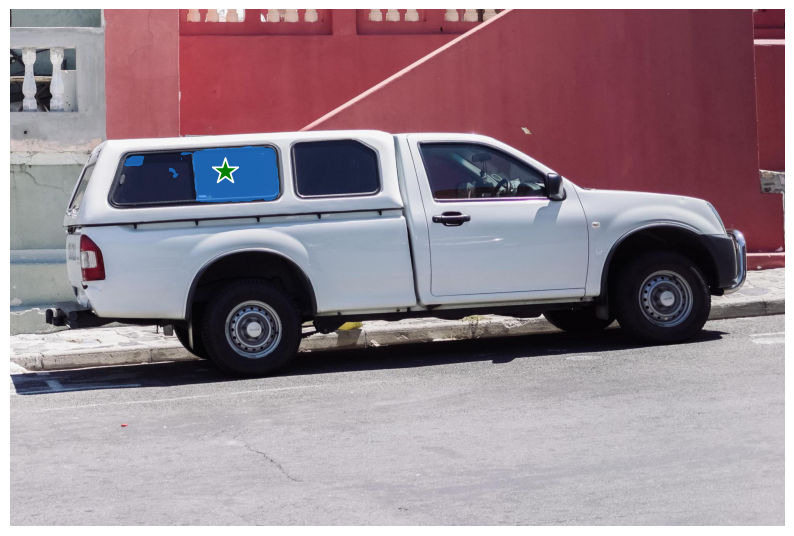

In [72]:
# Load INT8 model and run pipeline again
ov_encoder_model_int8 = core.read_model(ov_encoder_path_int8)
ov_encoder_int8 = core.compile_model(ov_encoder_model_int8, device.value)
encoding_results = ov_encoder_int8(preprocessed_image)
image_embeddings = encoding_results[ov_encoder_int8.output(0)]
high_res_256 = encoding_results[ov_encoder_int8.output(0)]
high_res_128 = encoding_results[ov_encoder_int8.output(0)]

input_point = np.array([[500, 375]])
input_label = np.array([1])
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)
inputs = {
    "image_embeddings": image_embeddings,
    # "high_res_feats_256": high_res_256,
    # "high_res_feats_128": high_res_128,
    "point_coords": coord,
    "point_labels": label,
}
results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1])
masks = masks > 0.0
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Run `INT8` model in automatic mask generation mode

  0%|          | 0/8 [00:00<?, ?it/s]

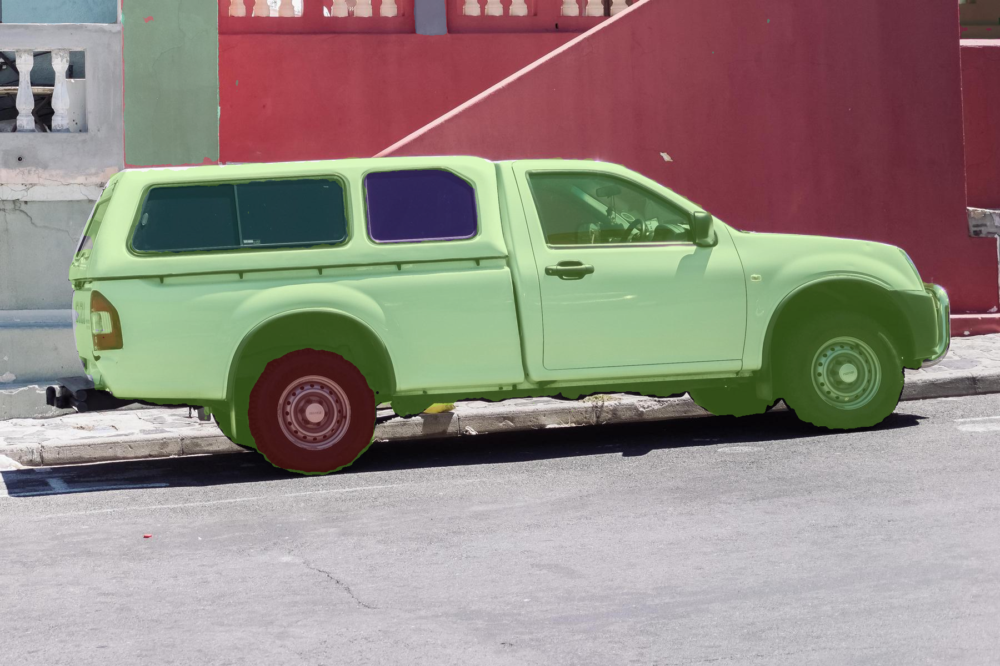

In [73]:
ov_encoder = ov_encoder_int8
prediction = automatic_mask_generation(image)
out = draw_anns(image, prediction)
cv2.imwrite("result_int8.png", out[:, :, ::-1])
PIL.Image.open("result_int8.png")

### Compare Performance of the Original and Quantized Models
[back to top ⬆️](#Table-of-contents:)
Finally, use the OpenVINO [Benchmark Tool](https://docs.openvino.ai/2024/learn-openvino/openvino-samples/benchmark-tool.html) to measure the inference performance of the `FP32` and `INT8` models.

In [74]:
# Inference FP32 model (OpenVINO IR)
!benchmark_app -m $ov_encoder_path -d $device.value

[Step 1/11] Parsing and validating input arguments
[ INFO ] Parsing input parameters
[Step 2/11] Loading OpenVINO Runtime
[ WARNING ] Default duration 120 seconds is used for unknown device AUTO
[ INFO ] OpenVINO:
[ INFO ] Build ................................. 2024.4.0-16327-033a5151e20
[ INFO ] 
[ INFO ] Device info:
[ INFO ] AUTO
[ INFO ] Build ................................. 2024.4.0-16327-033a5151e20
[ INFO ] 
[ INFO ] 
[Step 3/11] Setting device configuration
[ WARNING ] Performance hint was not explicitly specified in command line. Device(AUTO) performance hint will be set to PerformanceMode.THROUGHPUT.
[Step 4/11] Reading model files
[ INFO ] Loading model files
[ INFO ] Read model took 122.25 ms
[ INFO ] Original model I/O parameters:
[ INFO ] Model inputs:
[ INFO ]     image (node: image) : f32 / [...] / [1,3,1024,1024]
[ INFO ] Model outputs:
[ INFO ]     ***NO_NAME*** (node: aten::view/Reshape_2) : f32 / [...] / [1,256,64,64]
[ INFO ]     ***NO_NAME*** (node: aten::view/

In [75]:
# Inference INT8 model (OpenVINO IR)
!benchmark_app -m $ov_encoder_path_int8 -d $device.value

[Step 1/11] Parsing and validating input arguments
[ INFO ] Parsing input parameters
[Step 2/11] Loading OpenVINO Runtime
[ WARNING ] Default duration 120 seconds is used for unknown device AUTO
[ INFO ] OpenVINO:
[ INFO ] Build ................................. 2024.4.0-16327-033a5151e20
[ INFO ] 
[ INFO ] Device info:
[ INFO ] AUTO
[ INFO ] Build ................................. 2024.4.0-16327-033a5151e20
[ INFO ] 
[ INFO ] 
[Step 3/11] Setting device configuration
[ WARNING ] Performance hint was not explicitly specified in command line. Device(AUTO) performance hint will be set to PerformanceMode.THROUGHPUT.
[Step 4/11] Reading model files
[ INFO ] Loading model files
[ INFO ] Read model took 156.33 ms
[ INFO ] Original model I/O parameters:
[ INFO ] Model inputs:
[ INFO ]     image (node: image) : f32 / [...] / [1,3,1024,1024]
[ INFO ] Model outputs:
[ INFO ]     ***NO_NAME*** (node: aten::view/Reshape_2) : f32 / [...] / [1,256,64,64]
[ INFO ]     ***NO_NAME*** (node: aten::view/

## Video prediction
[back to top ⬆️](#Table-of-contents:)


SAM2 can be seen as a generalization of SAM to the video (and image) domain. SAM 2 supports point, box, and mask prompts on individual frames to define the spatial extent of the object to be segmented across the video. For image input, the model behaves similarly to SAM. A promptable and light-weight mask decoder accepts a frame embedding and prompts (if any) on the current frame and outputs a segmentation mask for the frame. Prompts can be iteratively added on a frame in order to refine the masks.
Unlike SAM, the frame embedding used by the SAM 2 decoder is not directly from an image encoder and is instead conditioned on memories of past predictions and prompted frames. It is possible for prompted frames to also come “from the future” relative to the current frame. Memories of frames are created by the memory encoder based on the current prediction and placed in a memory bank for use in subsequent frames. The memory attention operation takes the per-frame embedding from the image encoder and conditions it on the memory bank to produce an embedding that is then passed to the mask decoder


For promptable segmentation and tracking in videos, SAM2 provides a video predictor with APIs for example to add prompts and propagate mask throughout a video. SAM 2 supports video inference on multiple objects and uses an inference state to keep track of the interactions in each video.

### Load the SAM2 PyTorch model
[back to top ⬆️](#Table-of-contents:)


We will use `SAM2VideoPredictor` class to load the model `sam2-hiera-large` from [HuggingFace](https://huggingface.co/facebook/sam2-hiera-large). List of other SAM2 models could be found [here](https://huggingface.co/models?search=facebook/sam2).

In [78]:
from sam2.sam2_video_predictor import SAM2VideoPredictor

predictor_video = SAM2VideoPredictor.from_pretrained("facebook/sam2-hiera-large", device="cpu")

### Convert Image Encoder Model to OpenVINO IR
[back to top ⬆️](#Table-of-contents:)

### Convert Image Encoder Model to OpenVINO IR

In [79]:
if not Path("model_helper.py").exists():
    r = requests.get(url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/segment-anything/model_helper.py")
    open("model_helper.py", "w").write(r.text)

import model_helper

In [80]:
import openvino as ov

core = ov.Core()

In [81]:
import ipywidgets as widgets

device = widgets.Dropdown(
    options=core.available_devices + ["AUTO"],
    value="AUTO",
    description="Device:",
    disabled=False,
)

device

Dropdown(description='Device:', index=1, options=('CPU', 'AUTO'), value='AUTO')

Load the parameters for model `sam2_hiera_large` from config. 

In [82]:
import yaml

sam2_config = "./segment-anything-2/sam2_configs/sam2_hiera_l.yaml"

with open(sam2_config, "r") as f:
    model_info = yaml.safe_load(f)

#### Convert Image Encoder Model to OpenVINO IR
[back to top ⬆️](#Table-of-contents:)


The image encoder is only run once for the entire interaction and its role is to provide unconditioned tokens (feature embeddings) representing each frame.

Image Encoder input is tensor with shape `1x3x1024x1024` in `NCHW` format, contains image for segmentation. Image Encoder output is visual features, which includes:
- `backbone_fpn`: image embeddings as tensor with shape `1x256x64x64` and high resolution image embeddings as tensors  with shape `1x32x256x256`, `1x64x128x128`
- `vision_pos_enc`
- `vision_features`

In [99]:
import torch


class SamVideoImageEncoderModel(torch.nn.Module):
    def __init__(self, predictor) -> None:
        super().__init__()
        self.image_encoder = predictor.image_encoder
        self.predictor = predictor

    @torch.no_grad()
    def forward(
        self,
        image: torch.Tensor,
    ):
        backbone_out = self.image_encoder(image)

        if self.predictor.use_high_res_features_in_sam:
            # precompute projected level 0 and level 1 features in SAM decoder
            # to avoid running it again on every SAM click
            backbone_out["backbone_fpn"][0] = self.predictor.sam_mask_decoder.conv_s0(backbone_out["backbone_fpn"][0])
            backbone_out["backbone_fpn"][1] = self.predictor.sam_mask_decoder.conv_s1(backbone_out["backbone_fpn"][1])

        return (
            backbone_out["backbone_fpn"],
            backbone_out["vision_pos_enc"],
            backbone_out["vision_features"],
        )

In [100]:
from pathlib import Path
import warnings

ov_video_frame_encoder_path = Path("sam_video_image_encoder.xml")
if not ov_video_frame_encoder_path.exists():
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)

        video_frame_encoder_video = SamVideoImageEncoderModel(predictor_video)
        ov_video_frame_encoder_model = ov.convert_model(
            video_frame_encoder_video,
            example_input=torch.zeros(1, 3, 1024, 1024),
            input=([1, 3, 1024, 1024],),
        )
    ov.save_model(ov_video_frame_encoder_model, ov_video_frame_encoder_path)
else:
    ov_video_frame_encoder_model = core.read_model(ov_video_frame_encoder_path)

In [101]:
ov_video_frame_encoder_compl_model = core.compile_model(ov_video_frame_encoder_model, device.value)

#### Mask Prediction Model
[back to top ⬆️](#Table-of-contents:)


Mask prediction will be includes two models: 

*Prompt Encoder* - Encoder for segmentation condition. As a condition can be used points, boxes or segmentation mask.
*Mask Decoder* - The mask decoder efficiently maps the image embedding, prompt embeddings, and an output token to a mask.


Combined prompt encoder and mask decoder model has following list of inputs:
- `image_embeddings`: The image embedding from image_encoder. Has a batch index of length 1.
- `high_res_feats_256`: The high resolution embedding from image_encoder. Has a batch index of length 1.
- `high_res_feats_128`: The high resolution embedding from image_encoder. Has a batch index of length 1.
- `point_coords`: Coordinates of sparse input prompts, corresponding to both point inputs and box inputs. Boxes are encoded using two points, one for the top-left corner and one for the bottom-right corner. Has a batch index of length 1.
- `point_labels`: Labels for the sparse input prompts. 0 is a negative input point, 1 is a positive input point, 2 is a top-left box corner, 3 is a bottom-right box corner, and -1 is a padding point. *If there is no box input, a single padding point with label -1 and coordinates (0.0, 0.0) should be concatenated.


Model outputs: `low_res_multimasks`, `high_res_multimasks`, `ious` - intersection over union predictions, `low_res_masks` - predicted masks before postprocessing, can be used as mask input for model, `high_res_masks`, `obj_ptr`, `object_score_logits`


In [85]:
NO_OBJ_SCORE = -1024.0


class SamVideoMaskPredictorModel(torch.nn.Module):
    def __init__(
        self,
        model,
        multimask_output: bool,
        use_stability_score: bool = False,
        return_extra_metrics: bool = False,
    ) -> None:
        super().__init__()
        self.model = model
        self.img_size = model.image_size
        self.multimask_output = multimask_output
        self.use_stability_score = use_stability_score
        self.stability_score_offset = 1.0
        self.return_extra_metrics = return_extra_metrics

        self.prompt_encoder = model.sam_prompt_encoder
        self.mask_decoder = model.sam_mask_decoder
        self.pred_obj_scores = model.pred_obj_scores
        self.obj_ptr_proj = model.obj_ptr_proj

        self.no_obj_ptr = model.no_obj_ptr
        self.soft_no_obj_ptr = model.soft_no_obj_ptr
        self.fixed_no_obj_ptr = model.fixed_no_obj_ptr

    def _embed_points(self, point_coords: torch.Tensor, point_labels: torch.Tensor, pad: bool = True) -> torch.Tensor:
        point_coords = point_coords + 0.5
        point_coords = point_coords / self.img_size
        point_embedding = self.prompt_encoder.pe_layer._pe_encoding(point_coords)
        point_labels = point_labels.unsqueeze(-1).expand_as(point_embedding)

        point_embedding = point_embedding * (point_labels != -1).to(torch.float32)
        point_embedding = point_embedding + self.prompt_encoder.not_a_point_embed.weight * (point_labels == -1).to(torch.float32)

        for i in range(self.prompt_encoder.num_point_embeddings):
            point_embedding = point_embedding + self.prompt_encoder.point_embeddings[i].weight * (point_labels == i).to(torch.float32)
        return point_embedding

    def _batched_mode(self, point_coords: torch.Tensor, point_labels: torch.Tensor):
        point_coords = point_coords + 0.5
        point_coords = point_coords / self.img_size
        point_embedding = self.prompt_encoder.pe_layer._pe_encoding(point_coords)
        point_labels = point_labels.unsqueeze(-1).expand_as(point_embedding)

        concat_points = (point_coords, point_labels)
        batched_mode = concat_points is not None and concat_points[0].shape[0] > 1  # multi object prediction

        return batched_mode

    def _embed_masks(self, input_mask: torch.Tensor) -> torch.Tensor:
        mask_embedding = self.prompt_encoder.mask_downscaling(input_mask)
        return mask_embedding

    def mask_postprocessing(self, masks: torch.Tensor) -> torch.Tensor:
        masks = torch.nn.functional.interpolate(
            masks,
            size=(self.img_size, self.img_size),
            mode="bilinear",
            align_corners=False,
        )
        return masks

    @torch.no_grad()
    def forward(
        self,
        backbone_features,
        point_labels=None,
        point_coords=None,
        mask_inputs=None,
        high_res_feats_256=None,
        high_res_feats_128=None,
    ):
        mask_inputs = None
        sparse_embeddings = self._embed_points(point_coords, point_labels)
        if mask_inputs is None:
            dense_embeddings = self.prompt_encoder.no_mask_embed.weight.reshape(1, -1, 1, 1).expand(point_coords.shape[0], -1, backbone_features.shape[0], 64)
        else:
            dense_embeddings = self._embed_masks(mask_inputs)

        # batched_modes = self._batched_mode(point_coords, point_labels)
        (
            low_res_multimasks,
            ious,
            sam_output_tokens,
            object_score_logits,
        ) = self.mask_decoder(
            image_embeddings=backbone_features,
            image_pe=self.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=self.multimask_output,
            repeat_image=False,  # the image is already batched
            high_res_features=[high_res_feats_256, high_res_feats_128],
        )
        if self.pred_obj_scores:
            is_obj_appearing = object_score_logits > 0

            # Mask used for spatial memories is always a *hard* choice between obj and no obj,
            # consistent with the actual mask prediction
            low_res_multimasks = torch.where(
                is_obj_appearing[:, None, None],
                low_res_multimasks,
                NO_OBJ_SCORE,
            )

        # convert masks from possibly bfloat16 (or float16) to float32
        # (older PyTorch versions before 2.1 don't support `interpolate` on bf16)
        low_res_multimasks = low_res_multimasks.float()
        high_res_multimasks = torch.nn.functional.interpolate(
            low_res_multimasks,
            size=(self.img_size, self.img_size),
            mode="bilinear",
            align_corners=False,
        )

        sam_output_token = sam_output_tokens[:, 0]
        if self.multimask_output:
            # take the best mask prediction (with the highest IoU estimation)
            best_iou_inds = torch.argmax(ious, dim=-1)
            batch_inds = torch.arange(B, device=device)
            low_res_masks = low_res_multimasks[batch_inds, best_iou_inds].unsqueeze(1)
            high_res_masks = high_res_multimasks[batch_inds, best_iou_inds].unsqueeze(1)
            if sam_output_tokens.size(1) > 1:
                sam_output_token = sam_output_tokens[batch_inds, best_iou_inds]
        else:
            low_res_masks, high_res_masks = low_res_multimasks, high_res_multimasks

        # Extract object pointer from the SAM output token (with occlusion handling)
        obj_ptr = self.obj_ptr_proj(sam_output_token)
        if self.pred_obj_scores:
            # Allow *soft* no obj ptr, unlike for masks
            if self.soft_no_obj_ptr:
                # Only hard possible with gt
                assert not self.teacher_force_obj_scores_for_mem
                lambda_is_obj_appearing = object_score_logits.sigmoid()
            else:
                lambda_is_obj_appearing = is_obj_appearing.float()

            if self.fixed_no_obj_ptr:
                obj_ptr = lambda_is_obj_appearing * obj_ptr
            obj_ptr = obj_ptr + (1 - lambda_is_obj_appearing) * self.no_obj_ptr

        return (
            low_res_multimasks,
            high_res_multimasks,
            ious,
            low_res_masks,
            high_res_masks,
            obj_ptr,
            object_score_logits,
        )

In [86]:
ov_video_mask_pred_path = Path("ov_video_mask_predictor.xml")
if not ov_video_mask_pred_path.exists():
    mask_pred_model = SamVideoMaskPredictorModel(predictor_video, multimask_output=False)
    embed_dim = predictor_video.sam_prompt_encoder.embed_dim
    embed_size = predictor_video.sam_prompt_encoder.image_embedding_size

    hf_sizes = predictor._bb_feat_sizes

    dummy_inputs = {
        "backbone_features": torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
        "high_res_feats_256": torch.randn(1, 32, *hf_sizes[0], dtype=torch.float),
        "high_res_feats_128": torch.randn(1, 64, *hf_sizes[1], dtype=torch.float),
        "point_coords": torch.randint(low=0, high=1024, size=(1, 5, 2), dtype=torch.float),
        "point_labels": torch.randint(low=0, high=4, size=(1, 5), dtype=torch.float),
    }
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)
        ov_video_mask_pred_model = ov.convert_model(mask_pred_model, example_input=dummy_inputs)
    ov.save_model(ov_video_mask_pred_model, ov_video_mask_pred_path)
else:
    ov_video_mask_pred_model = core.read_model(ov_video_mask_pred_path)

In [87]:
ov_video_mask_pred_compl_model = core.compile_model(ov_video_mask_pred_model, device.value)

#### Memory Encoder Model
[back to top ⬆️](#Table-of-contents:)


The memory encoder generates a memory by down sampling the output mask using a convolutional module and summing it element-wise with the unconditioned frame embedding from the image-encoder, followed by light-weight convolutional layers to fuse the information.

Converted model has following list of inputs: `pix_feat`, `mask_for_mem`,  `skip_mask_sigmoid`


Model outputs: `vision_features`, `vision_pos_enc`

In [88]:
class MemoryEncoderModel(torch.nn.Module):
    def __init__(self, predictor) -> None:
        super().__init__()
        self.memory_encoder = predictor.memory_encoder
        self.predictor = predictor

    @torch.no_grad()
    def forward(self, pix_feat=None, mask_for_mem=None, skip_mask_sigmoid=torch.tensor(1)):
        maskmem_out = self.memory_encoder(
            pix_feat,
            mask_for_mem,
            skip_mask_sigmoid=(skip_mask_sigmoid == 1),  # sigmoid already applied
        )

        return maskmem_out["vision_features"], maskmem_out["vision_pos_enc"]

In [89]:
ov_video_mem_encoder_path = Path("ov_video_mem_encoder.xml")
if not ov_video_mem_encoder_path.exists():
    dummy_inputs = {
        "pix_feat": torch.randn(1, 256, 64, 64, dtype=torch.float),
        "mask_for_mem": torch.randn(1, 1, 1024, 1024, dtype=torch.float),
        "skip_mask_sigmoid": torch.tensor(1),
    }

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)

        video_mem_encoder_model = MemoryEncoderModel(predictor_video)
        ov_video_mem_encoder_model = ov.convert_model(video_mem_encoder_model, example_input=dummy_inputs)
    ov.save_model(ov_video_mem_encoder_model, ov_video_mem_encoder_path)
else:
    ov_video_mem_encoder_model = core.read_model(ov_video_mem_encoder_path)

In [90]:
ov_video_mem_encoder_compl_model = core.compile_model(ov_video_mem_encoder_model, device.value)

#### Memory Attention Model
[back to top ⬆️](#Table-of-contents:)


The role of memory attention is to condition the current frame features on the past frames features and predictions as well as on any new prompts. We stack L transformer blocks, the first one taking the image encoding from the current frame as input. Each block performs self-attention, followed by cross-attention to memories of (prompted/unprompted) frames and object pointers (see below), stored in a memory bank (see below), followed by an MLP. We use vanilla attention operations for self- and cross-attention, allowing us to benefit from recent developments in efficient attention kernels.

Converted model has following list of inputs: 
- `curr`: self-attention inputs
- `memory`: cross-attention inputs
- `curr_pos`: `pos_enc` for self-attention inputs
- `memory_pos`: `pos_enc` for cross-attention inputs
- `num_obj_ptr_tokens`: number of object pointer *tokens* 


Model outputs is `normed_output`

Handling of complex tensors is supported only 2D rotations. So, let's update the memory attention model to being able convert it.

In [93]:
# Matrix version of rotary enc
# https://github.com/facebookresearch/segment-anything-2/issues/186

import types

funcType = types.MethodType

for layer in predictor_video.memory_attention.layers:
    self_attn_feat_sizes = model_info["model"]["memory_attention"]["layer"]["self_attention"]["feat_sizes"]
    self_attn_rope_theta = model_info["model"]["memory_attention"]["layer"]["self_attention"]["rope_theta"]
    self_attn_rotmats = model_helper.get_rotation_matrices(
        dim=layer.self_attn.internal_dim // layer.self_attn.num_heads, end_x=self_attn_feat_sizes[0], end_y=self_attn_feat_sizes[1], theta=self_attn_rope_theta
    )
    setattr(layer.self_attn, "rotmats", self_attn_rotmats)
    setattr(layer.self_attn, "rope_theta", self_attn_rope_theta)
    layer.self_attn.forward = funcType(model_helper.matrix_rope_forward, layer.self_attn)

    cross_attn_feat_sizes = model_info["model"]["memory_attention"]["layer"]["self_attention"]["feat_sizes"]
    cross_attn_rope_theta = model_info["model"]["memory_attention"]["layer"]["self_attention"]["rope_theta"]
    cross_attn_rotmats = model_helper.get_rotation_matrices(
        dim=layer.cross_attn_image.internal_dim // layer.cross_attn_image.num_heads,
        end_x=cross_attn_feat_sizes[0],
        end_y=cross_attn_feat_sizes[1],
        theta=cross_attn_rope_theta,
    )
    setattr(layer.cross_attn_image, "rotmats", cross_attn_rotmats)
    setattr(layer.cross_attn_image, "rope_theta", cross_attn_rope_theta)
    layer.cross_attn_image.forward = funcType(model_helper.matrix_rope_forward, layer.cross_attn_image)

In [94]:
class MemoryAttentionModel(torch.nn.Module):
    def __init__(
        self,
        predictor,
    ) -> None:
        super().__init__()
        self.memory_attention_predictor = predictor.memory_attention

    @torch.no_grad()
    def forward(
        self,
        curr: torch.Tensor,
        memory: torch.Tensor,
        curr_pos: torch.Tensor = None,
        memory_pos: torch.Tensor = None,
        num_obj_ptr_tokens: int = 0,
    ):
        normed_output = self.memory_attention_predictor(
            curr=curr, curr_pos=curr_pos, memory=memory, memory_pos=memory_pos, num_obj_ptr_tokens=num_obj_ptr_tokens
        )

        return normed_output

In [95]:
ov_memory_attention_path = Path("ov_memory_attention_model.xml")
if not ov_memory_attention_path.exists():
    dummy_inputs = {
        "curr": torch.zeros(4096, 1, 256),
        "curr_pos": torch.zeros(4096, 1, 256),
        "memory": torch.zeros(4100, 1, 64),
        "memory_pos": torch.zeros(4100, 1, 64),
        "num_obj_ptr_tokens": torch.tensor(4),
    }

    memory_attention = MemoryAttentionModel(predictor_video)
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)

        ov_memory_attention_model = ov.convert_model(
            memory_attention,
            example_input=dummy_inputs,
        )
    ov.save_model(ov_memory_attention_model, ov_memory_attention_path)
else:
    ov_memory_attention_model = core.read_model(ov_memory_attention_path)

In [96]:
ov_memory_attention_comp_model = core.compile_model(ov_memory_attention_model, device.value)

### Infer video prediction model in OpenVINO IR format
[back to top ⬆️](#Table-of-contents:)



To infer video we will use `OVSAM2VideoPredictor`. `OVSAM2VideoPredictor` inherits `SAM2VideoPredictor` behavior, but overloads some functions to use models converted to OpenVINO IR format.

In [97]:
memory_encoder_out_proj_weight_shape = None

if hasattr(predictor_video.memory_encoder, "out_proj") and hasattr(predictor_video.memory_encoder.out_proj, "weight"):
    # if there is compression of memories along channel dim
    memory_encoder_out_proj_weight_shape = predictor_video.memory_encoder.out_proj.weight.shape[0]

setattr(ov_memory_attention_comp_model, "d_model", predictor_video.memory_attention.d_model)

In [102]:
ov_predictor_video = model_helper.OVSAM2VideoPredictor.from_pretrained(
    model_info=model_info,
    ov_image_encoder=ov_video_frame_encoder_compl_model,
    ov_mask_encoder=ov_video_mask_pred_compl_model,
    ov_memory_encoder=ov_video_mem_encoder_compl_model,
    ov_memory_attention_model=ov_memory_attention_comp_model,
    memory_encoder_out_proj_weight_shape=memory_encoder_out_proj_weight_shape,
)

### Prepare data
[back to top ⬆️](#Table-of-contents:)

### Prepare data

In [103]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor="green", facecolor=(0, 0, 0, 0), lw=2))

In [104]:
sample_path = Path("data")
sample_path.mkdir(parents=True, exist_ok=True)

download_file(
    "https://storage.openvinotoolkit.org/repositories/openvino_notebooks/data/data/video/Coco%20Walking%20in%20Berkeley.mp4",
    directory=sample_path,
    filename="coco.mp4",
)

'data/coco.mp4' already exists.


PosixPath('/home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything/data/coco.mp4')

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video. It could be initialized with `init_state(video_path)`. During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state`. If video is changed we will reset inference_state_ov with `reset_state(inference_state)`.


To give a prompt about the object we want to segment we will send coordinates and labels to `add_new_points_or_box` API. Except coordinates and labels we should specify `inference_state`, which was initialized on the previous step, `ann_frame_idx` - the frame index we interact with and `ann_obj_id` - a unique id to each object we interact with, it can be any integers. Using different `ann_obj_id` we could be segmented two or more objects in same time.


To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.


`SegmenterVideo` is combined all this method to help make the inference easier. In `SegmenterVideo.set_video` we load the video from source, reset previous state and initialized state with new frames. `save_as_video` method save segmented frames to mp4 video.

In [105]:
import shutil
import os


class SegmenterVideo:
    def __init__(self, ov_predictor_video, max_frame_size=50, data_video_path="data_video"):
        self.ov_predictor_video = ov_predictor_video
        # self.video = None
        self.inference_state_ov = None
        self.ann_frame_idx = 0
        self.ann_obj_id = 1
        self.video_segments = {}
        # 0 all frames is needed
        self.max_frame_size = max_frame_size
        self.work_dir_path = data_video_path

        self.width = None
        self.height = None

    def set_video(
        self,
        video_path,
    ):
        if self.inference_state_ov:
            self.ov_predictor_video.reset_state(self.inference_state_ov)
            self.video_segments = {}
            self.ann_frame_idx = 0
            self.ann_obj_id = 1

        vcap = cv2.VideoCapture(video_path)

        self.width = vcap.get(cv2.CAP_PROP_FRAME_WIDTH)
        self.height = vcap.get(cv2.CAP_PROP_FRAME_HEIGHT)

        totalNoFrames = vcap.get(cv2.CAP_PROP_FRAME_COUNT)
        max_frame_size = int(totalNoFrames) - 1 if self.max_frame_size == 0 or totalNoFrames < self.max_frame_size else self.max_frame_size
        if os.path.exists(self.work_dir_path):
            shutil.rmtree(self.work_dir_path)
        os.mkdir(self.work_dir_path)

        if vcap.isOpened():
            rval, frame = vcap.read()
        else:
            rval = False

        frame_idx = 0
        while rval and frame_idx < max_frame_size:
            rval, frame = vcap.read()
            cv2.imwrite(os.path.join(self.work_dir_path, f"{frame_idx}.jpg"), frame)
            frame_idx += 1
            cv2.waitKey(1)
        vcap.release()

        self.inference_state_ov = self.ov_predictor_video.init_state(video_path=self.work_dir_path)

        return video_path

    def add_new_points_or_box(self, points, labels):
        _, out_obj_ids, out_mask_logits = self.ov_predictor_video.add_new_points_or_box(
            inference_state=self.inference_state_ov, frame_idx=self.ann_frame_idx, obj_id=self.ann_obj_id, points=points, labels=labels
        )

        return out_obj_ids, out_mask_logits

    def propagate_in_video(self):
        self.video_segments = {}

        for (
            out_frame_idx,
            out_obj_ids,
            out_mask_logits,
        ) in self.ov_predictor_video.propagate_in_video(self.inference_state_ov):
            self.video_segments[out_frame_idx] = {out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy() for i, out_obj_id in enumerate(out_obj_ids)}

        return self.video_segments

    def save_as_video(self, output_filename="results.mp4"):
        frame_names = [p for p in os.listdir(self.work_dir_path) if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]]
        frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

        FOURCC = cv2.VideoWriter_fourcc(*"vp09")
        out = cv2.VideoWriter(output_filename, FOURCC, 30, (int(self.width), int(self.height)))

        color = np.random.randint(0, 255, size=(1, 1, 3))

        for out_frame_idx in range(len(frame_names)):
            img = cv2.imread(os.path.join(self.work_dir_path, frame_names[out_frame_idx]))

            for out_obj_id, out_mask in self.video_segments[out_frame_idx].items():
                out_mask = np.transpose(out_mask, (1, 2, 0))

                out_img = img.copy()
                out_img[out_mask.squeeze(-1)] = color
                result = cv2.addWeighted(img.astype(np.float32), 0.7, out_img.astype(np.float32), 0.3, 0)

                result = result.astype(np.uint8)
                out.write(result)

        cv2.destroyAllWindows()
        out.release()

        return output_filename

In [106]:
sample_path = Path("data")

segmenter_video = SegmenterVideo(ov_predictor_video)
segmenter_video.set_video(sample_path / "coco.mp4")

frame loading (JPEG): 100%|█████████████████████| 50/50 [00:00<00:00, 54.39it/s]


PosixPath('data/coco.mp4')

/home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything/segment-anything-2/sam2/sam2_video_predictor.py:873: UserWarning: cannot import name '_C' from 'sam2' (/home/labuser/work/notebook/openvino_notebooks/notebooks/segment-anything/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


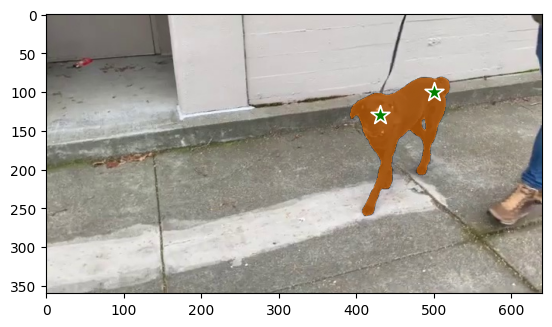

In [107]:
input_point = np.array([[430, 130], [500, 100]])
input_label = np.array([1, 1])

out_obj_ids, out_mask_logits = segmenter_video.add_new_points_or_box(input_point, input_label)

frame_0 = Image.open(os.path.join(segmenter_video.work_dir_path, "0.jpg"))
plt.imshow(np.array(frame_0.convert("RGB")))
show_points(np.array(input_point), np.array(input_label), plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])
plt.show()

In [108]:
res = segmenter_video.propagate_in_video()

propagate in video: 100%|███████████████████████| 50/50 [01:48<00:00,  2.17s/it]


In [109]:
video_out_path = segmenter_video.save_as_video()

In [110]:
import IPython

IPython.display.Video(filename="results.mp4", embed=True)

### Run Interactive Segmentation with Gradio
[back to top ⬆️](#Table-of-contents:)

In [ ]:
if not Path("gradio_helper.py").exists():
    r = requests.get(url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/segment-anything/gradio_helper.py")
    open("gradio_helper.py", "w").write(r.text)

from gradio_helper import make_video_demo

segmenter = SegmenterVideo(ov_predictor_video)
demo = make_video_demo(segmenter, sample_path)

try:
    demo.launch()
except Exception:
    demo.launch(share=True)
# If you are launching remotely, specify server_name and server_port
# EXAMPLE: `demo.launch(server_name="your server name", server_port="server port in int")`
# To learn more please refer to the Gradio docs: https://gradio.app/docs/